## introexon 

In [7]:
import scanpy as sc
import pandas as pd
import numpy as np

In [8]:
introexon=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/Smartseq3xpress_umicount_intronexon.h5ad")
introexon

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3840 × 53040
    obs: 'sample_ID_Plate'

In [9]:
introexon.layers["umi"] = introexon.X.copy() # save the UMI counts in a new layer

In [10]:
introexon.var_names_make_unique()
introexon

AnnData object with n_obs × n_vars = 3840 × 53040
    obs: 'sample_ID_Plate'
    layers: 'umi'

In [11]:
introexon.var_names

Index(['Gnai3', 'Pbsn', 'Cdc45', 'H19', 'Scml2', 'Apoh', 'Narf', 'Cav2',
       'Klf6', 'Scmh1',
       ...
       'rRNA_rnacentral_332', 'rRNA_rnacentral_340', 'rRNA_rnacentral_341',
       'rRNA_rnacentral_342', 'rRNA_rnacentral_348', 'rRNA_rnacentral_361',
       'rRNA_rnacentral_367', 'rRNA_rnacentral_86', 'rRNA_rnacentral_88',
       'rRNA_rnacentral_95'],
      dtype='object', length=53040)

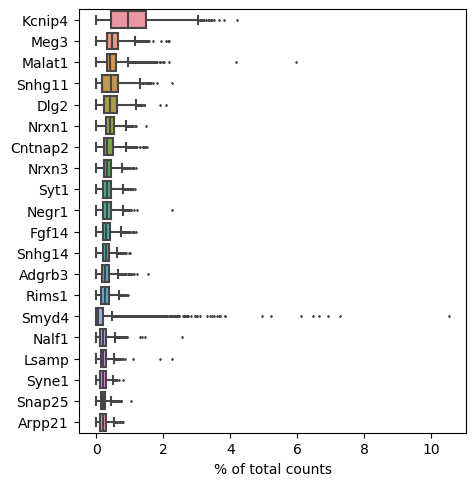

In [12]:
sc.pl.highest_expr_genes(introexon, n_top=20, )


In [13]:
sc.pp.filter_cells(introexon, min_genes=200)
sc.pp.filter_genes(introexon, min_cells=3)

In [14]:
introexon

AnnData object with n_obs × n_vars = 3833 × 31392
    obs: 'sample_ID_Plate', 'n_genes'
    var: 'n_cells'
    layers: 'umi'

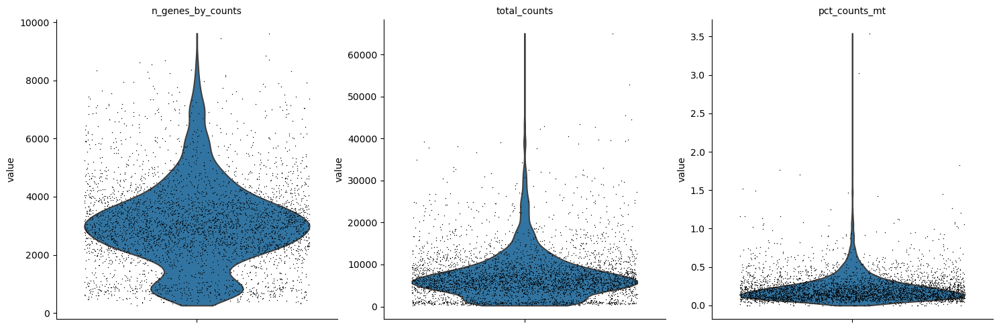

In [15]:
introexon.var['mt'] = introexon.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(introexon, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)\

sc.pl.violin(introexon, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

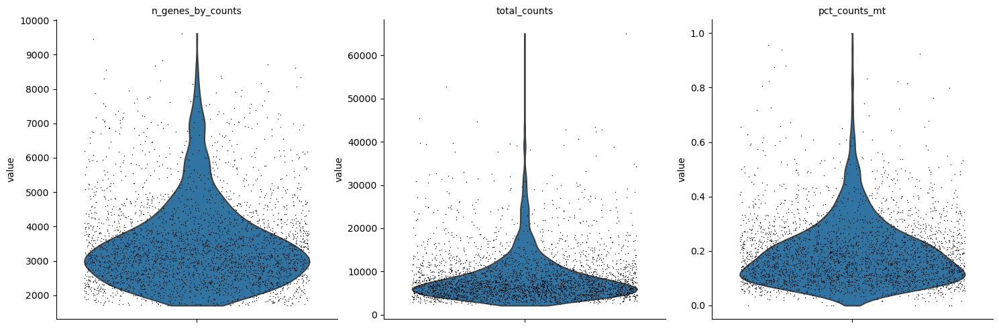

In [16]:
introexon1=introexon[introexon.obs.n_genes_by_counts > 1700, :]
introexon1=introexon1[introexon1.obs.pct_counts_mt < 1.0,]
sc.pl.violin(introexon1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [17]:
introexon1

View of AnnData object with n_obs × n_vars = 3214 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'umi'

In [18]:
introexon2=introexon1.copy()

In [19]:
introexon2

AnnData object with n_obs × n_vars = 3214 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'umi'

In [ ]:
#sc.pp.filter_genes(introexon2, min_cells=10)
#introexon2

AnnData object with n_obs × n_vars = 3214 × 25129
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'umi'

In [20]:
introexon2.var_names

Index(['Gnai3', 'Pbsn', 'Cdc45', 'H19', 'Scml2', 'Apoh', 'Narf', 'Cav2',
       'Klf6', 'Scmh1',
       ...
       'rRNA_rnacentral_244', 'rRNA_rnacentral_245', 'rRNA_rnacentral_246',
       'rRNA_rnacentral_247', 'rRNA_rnacentral_252', 'rRNA_rnacentral_253',
       'rRNA_rnacentral_340', 'rRNA_rnacentral_341', 'rRNA_rnacentral_342',
       'rRNA_rnacentral_88'],
      dtype='object', length=31392)

In [21]:
#save it as h5ad file
introexon2.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/Smartseq3xpress_umicount_intronexon.h5ad")

### analysis

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
# read
#introexon2=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/name_changed/Smartseq3xpress_umicount_intronexon.h5ad")
#introexon2

In [2]:
introexon2=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/name_changed/Smartseq3xpress_umicount_intronexon.h5ad")
introexon2

AnnData object with n_obs × n_vars = 5965 × 21107
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

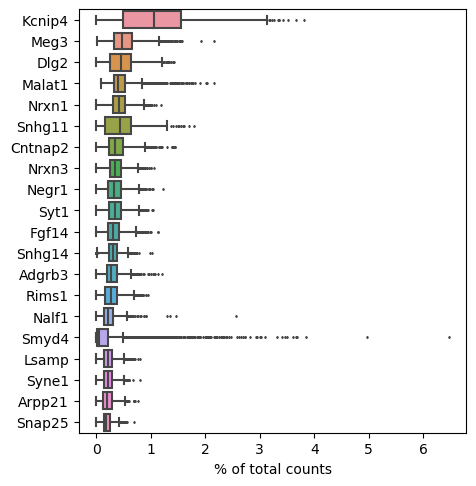

In [22]:
sc.pl.highest_expr_genes(introexon2, n_top=20, )

In [23]:
sc.pp.normalize_total(introexon2, target_sum=None)


In [24]:
sc.pp.log1p(introexon2)


In [25]:
introexon2

AnnData object with n_obs × n_vars = 3214 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'umi'

In [26]:
sc.pp.highly_variable_genes(introexon2, n_top_genes=1000, flavor='seurat_v3',layer='umi')


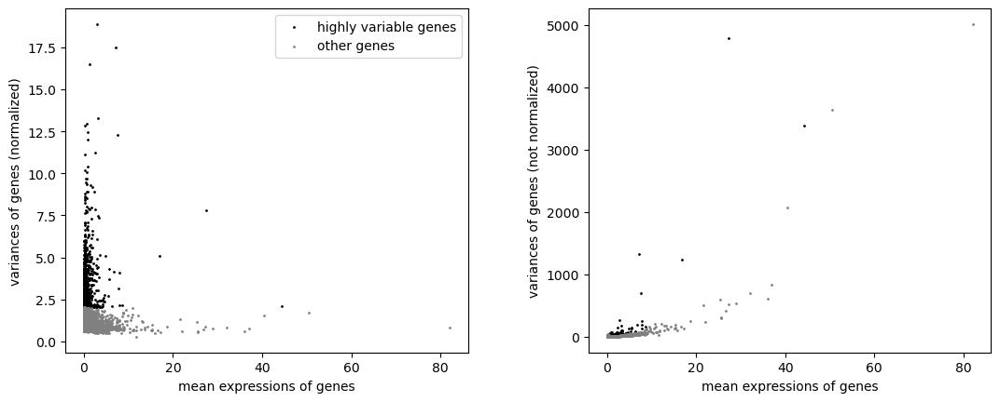

In [27]:
sc.pl.highly_variable_genes(introexon2)

In [28]:
introexon3 = introexon2

In [29]:
introexon2=introexon3.copy()

In [30]:
introexon2

AnnData object with n_obs × n_vars = 3214 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'
    layers: 'umi'

In [31]:
introexon2.raw= introexon2

In [ ]:
# sc.pp.regress_out(introexon2, ['total_counts', 'pct_counts_mt'])


In [32]:
introexon2

AnnData object with n_obs × n_vars = 3214 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'
    layers: 'umi'

In [33]:
sc.pp.scale(introexon2, max_value=10)


In [ ]:
sc.settings.n_jobs=4

In [34]:
sc.tl.pca(introexon2, svd_solver='arpack')


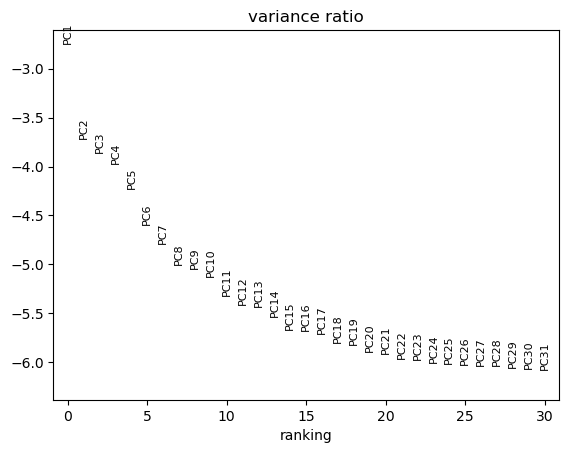

In [35]:
sc.pl.pca_variance_ratio(introexon2, log=True)


In [38]:
sc.pp.neighbors(introexon2, n_neighbors=50, n_pcs=20)


In [39]:
sc.tl.leiden(introexon2, resolution=0.3)

In [40]:
sc.tl.umap(introexon2,min_dist=0.2)

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


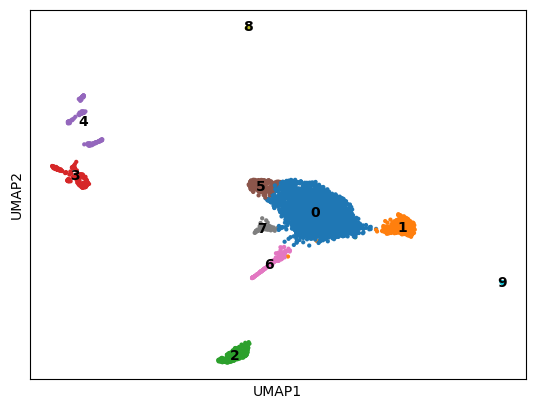

In [43]:
# show the louvain clusters in the UMAP
sc.pl.umap(introexon2, color=['leiden'], legend_loc='on data', title='')

In [44]:
#save it as h5ad file
introexon2.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/Smartseq3xpress_umicount_intronexon.h5ad")

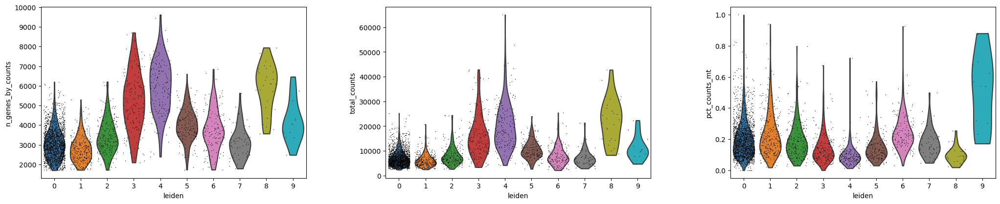

In [45]:
sc.pl.violin(introexon2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True,groupby='leiden')

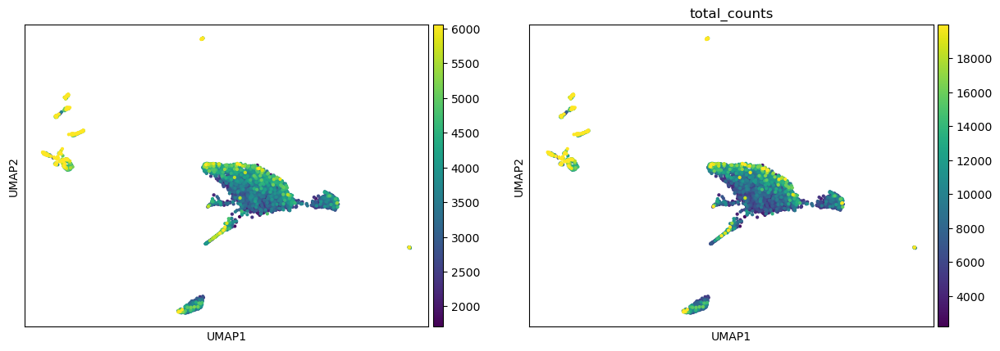

In [46]:
#show n_genes_by_counts
sc.pl.umap(introexon2, color=['n_genes_by_counts','total_counts'], legend_loc='on data', title='',vmax='p95')

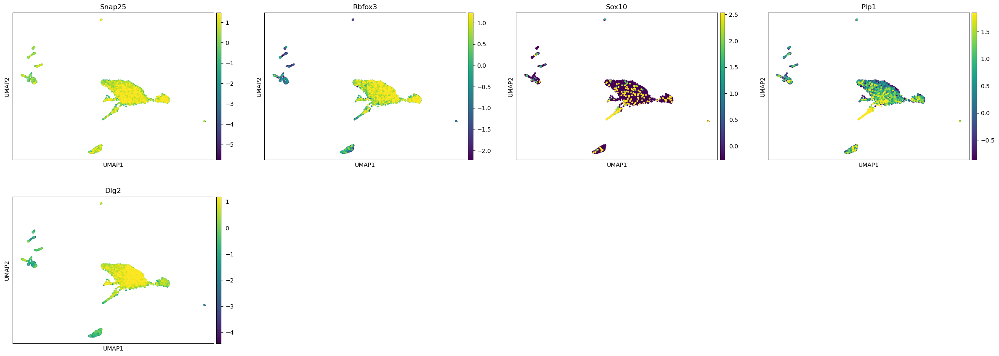

In [50]:
sc.pl.umap(introexon2, color=['Snap25','Rbfox3','Sox10','Plp1','Dlg2'], legend_loc='on data',vmax='p95')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldc

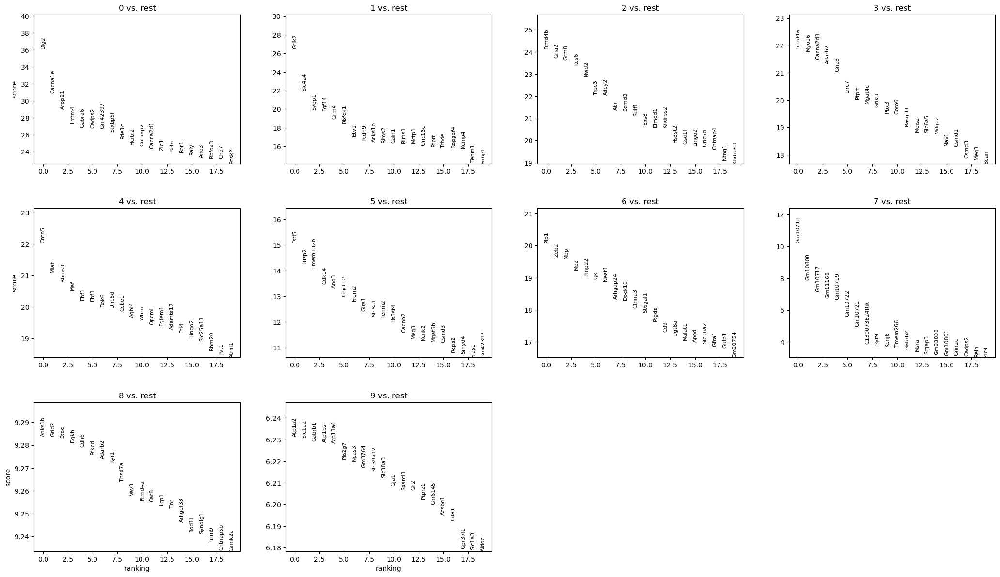

In [49]:
sc.tl.rank_genes_groups(introexon2, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(introexon2, n_genes=20, sharey=False)

In [ ]:
sc.get.rank_genes_groups(introexon2)

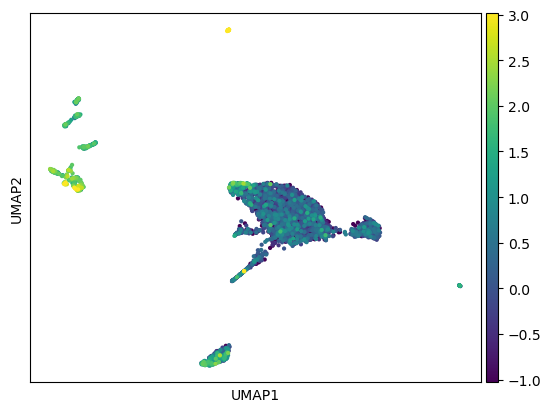

In [51]:
sc.pl.umap(introexon2,color=['Frmd4a'],legend_loc='on data',title='',vmax='p99')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


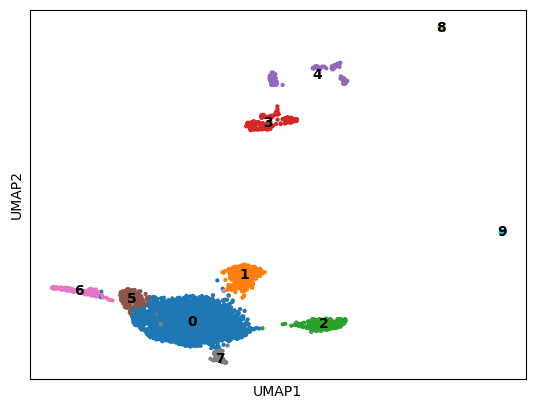

In [52]:
sc.tl.umap(introexon2,min_dist=0.3)
sc.pl.umap(introexon2,color=['leiden'],legend_loc='on data',title='',)

In [ ]:
introexon2

AnnData object with n_obs × n_vars = 3214 × 25129
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'distances', 'connectivities'

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


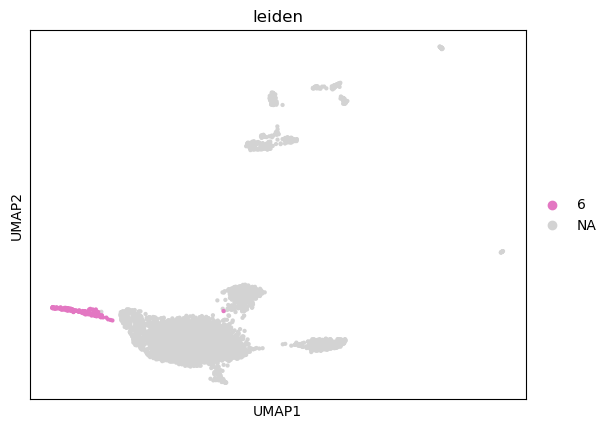

In [60]:
sc.pl.umap(introexon2, color=['leiden'], groups='6')

### only focus on group 6

In [62]:
group6

View of AnnData object with n_obs × n_vars = 149 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'sample_ID_Plate_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'distances', 'connectivities'

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


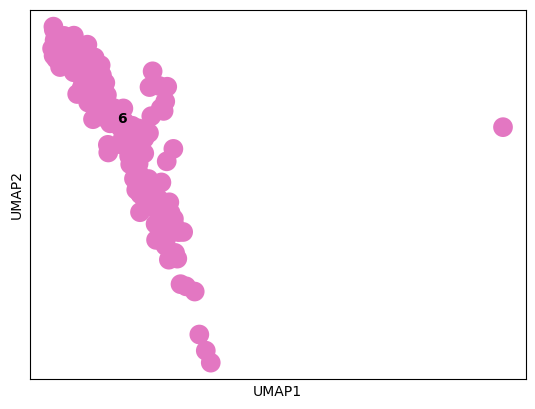

In [61]:
group6 = introexon2[introexon2.obs['leiden'] == '6']

sc.pl.umap(group6, color='leiden', legend_loc='on data', title='')



/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


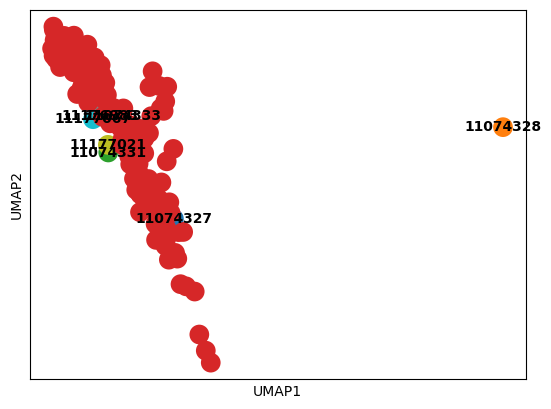

In [64]:
sc.pl.umap(group6, color='sample_ID_Plate', legend_loc='on data', title='')


In [63]:
group6.obs['sample_ID_Plate'].value_counts()


sample_ID_Plate
11074333    143
11074327      1
11074328      1
11074331      1
11176983      1
11177021      1
11177067      1
Name: count, dtype: int64

### keep going 

### because 1074333 seems unnormal, remove group 6 and keep going 

In [65]:
introexon_no6=introexon2[introexon2.obs.leiden!='6'].copy()
introexon_no6

AnnData object with n_obs × n_vars = 3065 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'sample_ID_Plate_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'distances', 'connectivities'

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


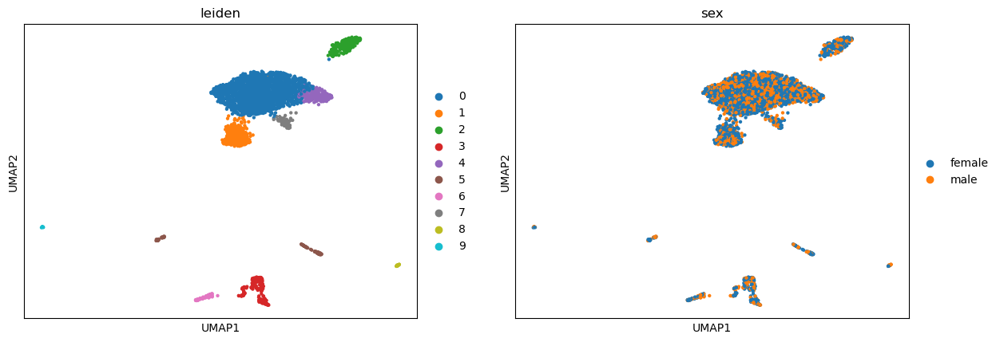

In [91]:
sc.pl.umap(introexon_no6,color=['leiden','sex'],vmax='p99')

In [66]:
#save it as h5ad file
introexon_no6.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/introexon_no6.h5ad")

In [2]:
import scanpy as sc
introexon_no6=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/introexon_no6.h5ad")

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/umap/distances.py:

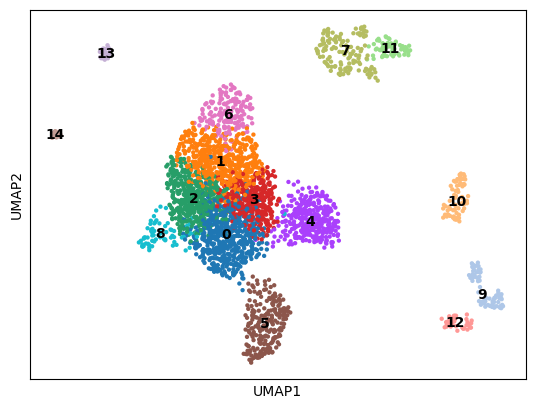

In [3]:
sc.pp.neighbors(introexon_no6, n_neighbors=20, n_pcs=20)
sc.tl.umap(introexon_no6,min_dist=0.9)
sc.tl.leiden(introexon_no6, resolution=0.8)
sc.pl.umap(introexon_no6,color=['leiden'],legend_loc='on data',title='',)

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.co

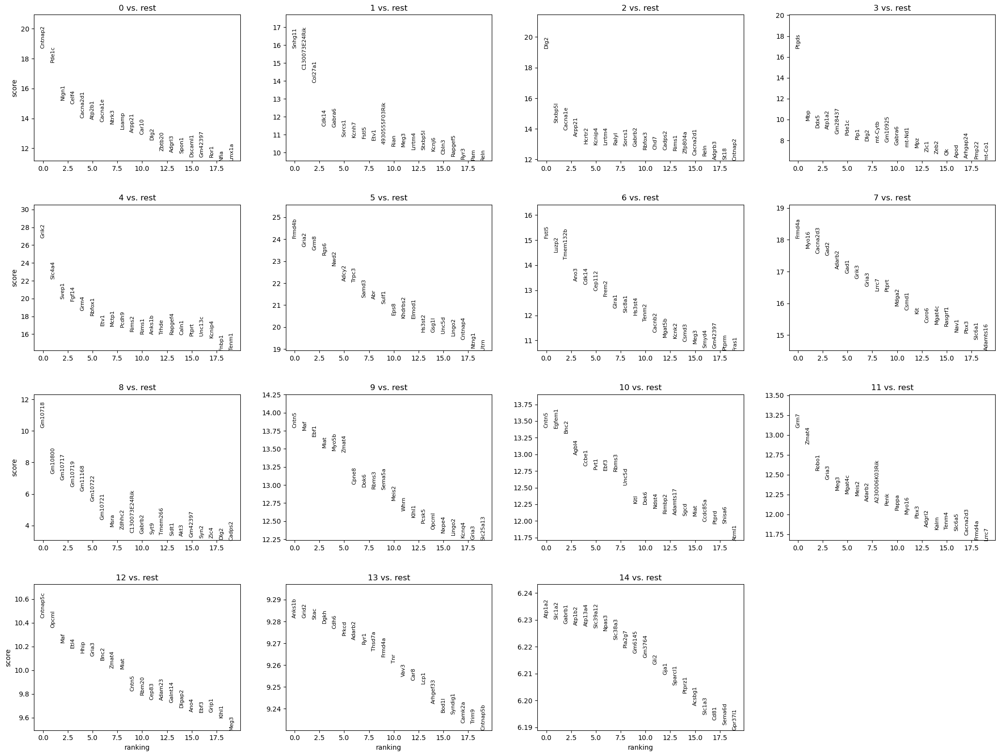

In [5]:
import pandas as pd
sc.pp.log1p(introexon_no6)
sc.tl.rank_genes_groups(introexon_no6, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(introexon_no6, n_genes=20, sharey=False)
df=sc.get.rank_genes_groups_df(introexon_no6, pval_cutoff=0.05, log2fc_min=0, key='rank_genes_groups',group='0')

In [6]:
df

,names,scores,logfoldchanges,pvals,pvals_adj
0,Nrxn1,8.315236,7.960277,9.156974e-17,2.763997e-14
1,Mir124a-1hg,5.102578,5.593097,3.350582e-07,2.516303e-05
2,Snap25,4.701270,5.334055,2.585486e-06,1.557842e-04
3,Hivep2,4.480709,6.975849,7.439561e-06,3.879447e-04
4,Gria2,3.825116,2.673111,1.307103e-04,4.283152e-03
...,...,...,...,...,...
64,Sh3d19,-5.624636,3.826262,1.858996e-08,1.747234e-06
65,Pard3,-5.687377,5.425075,1.290054e-08,1.246073e-06
66,9530059O14Rik,-5.837224,7.343124,5.307780e-09,5.445158e-07
67,Edil3,-6.197802,3.138681,5.725706e-10,7.098791e-08


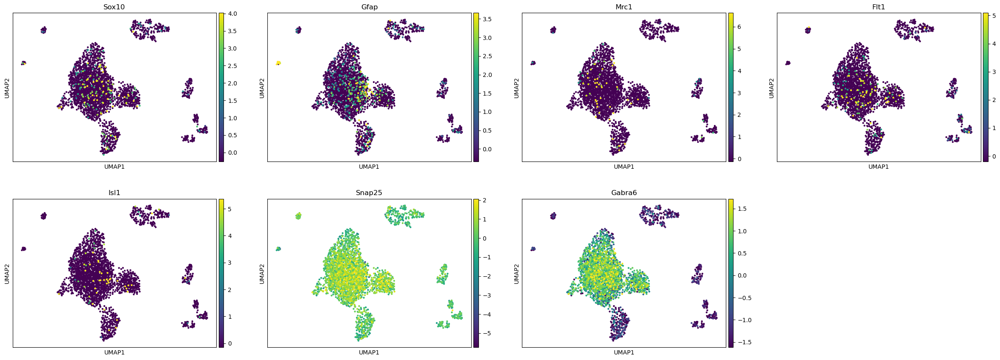

In [7]:
sc.pl.umap(introexon_no6,color=['Sox10','Gfap','Mrc1','Flt1','Isl1','Snap25','Gabra6'],vmax='p99')

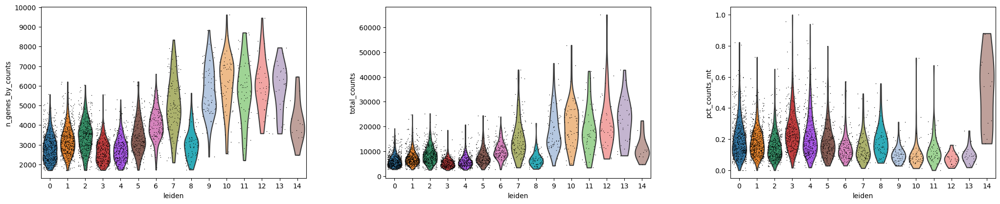

In [8]:
sc.pl.violin(introexon_no6, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True,groupby='leiden')

In [9]:
introexon_no6

AnnData object with n_obs × n_vars = 3065 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [10]:
#check the gender
# Identify the cells with expression of 'Uty' gene
introexon_no6.obs['sex'] = ['male' if val > 0 else 'female' for val in introexon_no6[:, 'Uty'].X]

# Now, 'sex' annotation has been added to the adata object
introexon_no6

AnnData object with n_obs × n_vars = 3065 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

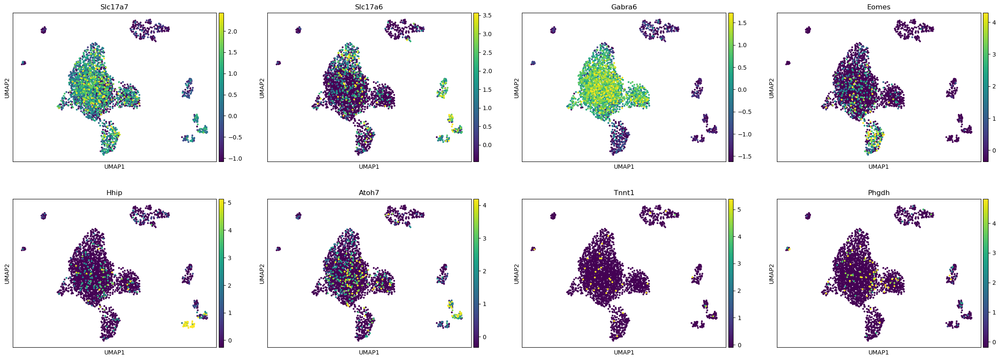

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


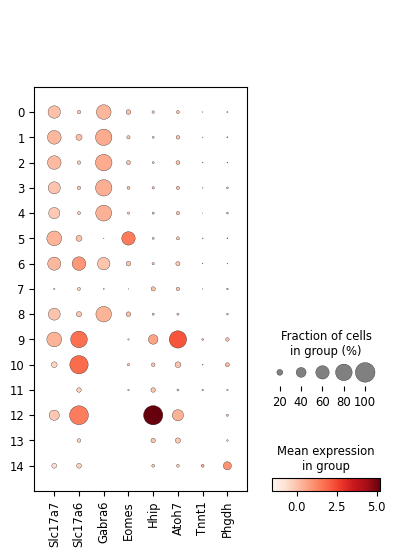

In [11]:
#For glutamatergic clusters: Slc17a7, Slc17a6, Gabra6, Tbr2, Hhip, Atoh7, Fam129a, Tnnt1, Phgdh
glutamateric_marker=['Slc17a7', 'Slc17a6', 'Gabra6', 'Eomes', 'Hhip', 'Atoh7', 'Tnnt1', 'Phgdh']
sc.pl.umap(introexon_no6,color=glutamateric_marker,vmax='p99')
sc.pl.dotplot(introexon_no6,glutamateric_marker,groupby='leiden')

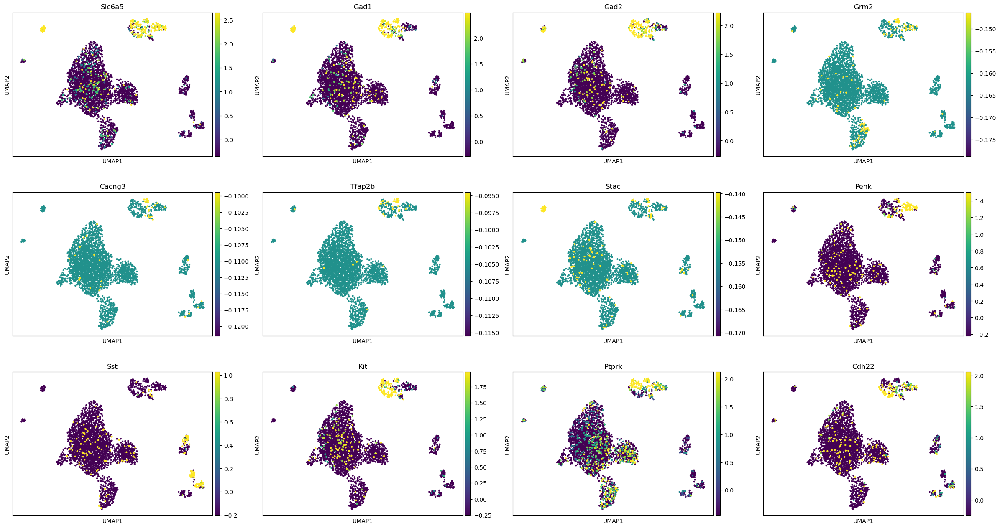

In [12]:
# For glycinergic clusters: Slc6a5, Gad1, Gad2, Grm2, Cacng3, Tfap2b, Stac, Penk, Sst, Kit, Ptprk, Cdh22
glycinergic_markers=['Slc6a5', 'Gad1', 'Gad2', 'Grm2', 'Cacng3', 'Tfap2b', 'Stac', 'Penk', 'Sst', 'Kit', 'Ptprk', 'Cdh22']
sc.pl.umap(introexon_no6,color=glycinergic_markers,vmax='p95')

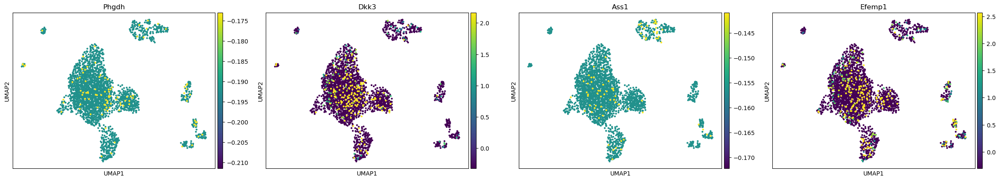

In [13]:
#octopus cells Phgdh, Dkk3, Ass1 and Efemp1

octopus_marker=['Phgdh','Dkk3','Ass1','Efemp1']
sc.pl.umap(introexon_no6,color=octopus_marker,vmax='p95')

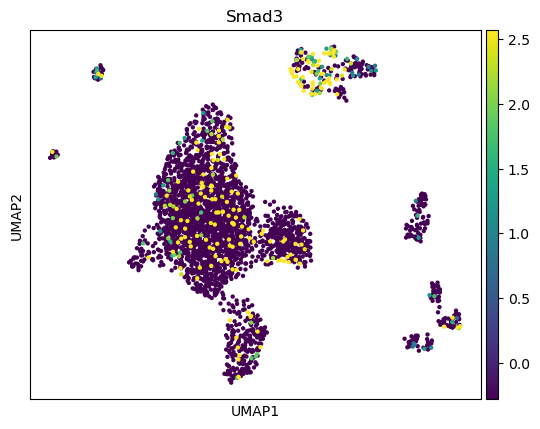

In [14]:
#Smad3 as a novel marker for unipolar brush cells.

sc.pl.umap(introexon_no6,color='Smad3',vmax='p95')

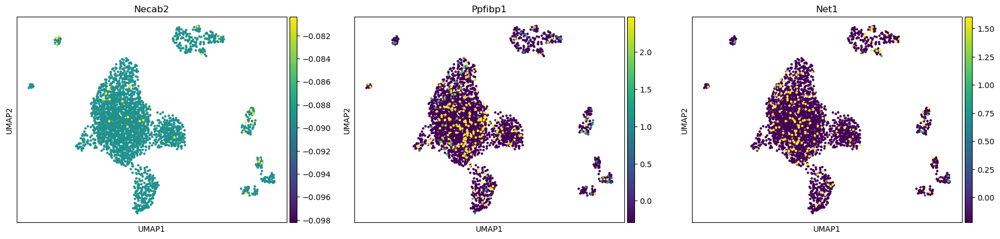

In [15]:
#Necab2, Ppfibp1 and Net1 as novel markers for fusiform cells

fusiform_markers = ['Necab2', 'Ppfibp1', 'Net1']
sc.pl.umap(introexon_no6,color=fusiform_markers,vmax='p95')

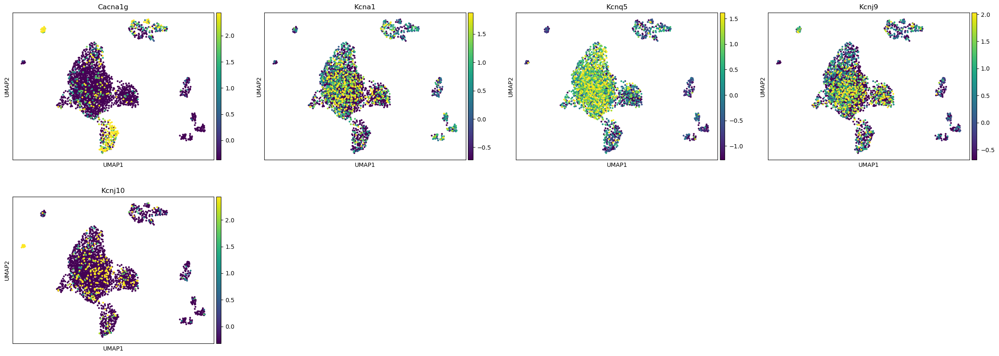

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


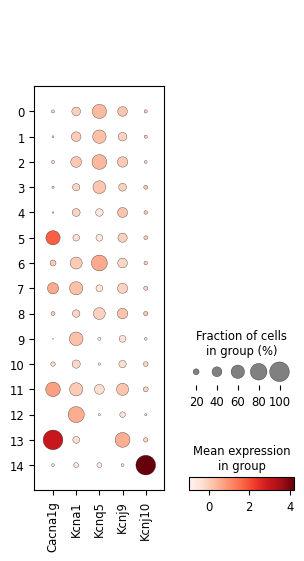

In [16]:
bushy_cell=['Cacna1g','Kcna1','Kcnq5','Kcnj9','Kcnj10']
sc.pl.umap(introexon_no6,color=bushy_cell, vmax='p95')
sc.pl.dotplot(introexon_no6, bushy_cell, groupby='leiden')

In [17]:
import pandas as pd

# Extracting rank_genes_groups result
result = introexon_no6.uns['rank_genes_groups']

# Creating separate dataframes for each group
groups = result['names'].dtype.names
dfs = {}
for group in groups:
    df = pd.DataFrame({
        'names': result['names'][group],
        'scores': result['scores'][group],
        'pvals': result['pvals'][group],
        'pvals_adj': result['pvals_adj'][group]
    })
    dfs[group] = df

dfs['7']


,names,scores,pvals,pvals_adj
0,Frmd4a,18.049330,7.985357e-73,2.506763e-68
1,Myo16,17.738443,2.117167e-70,2.651679e-66
2,Cacna2d3,17.565254,4.546478e-69,3.568076e-65
3,Gad2,17.509855,1.205018e-68,7.565585e-65
4,Adarb2,17.078716,2.137699e-65,9.586664e-62
...,...,...,...,...
31387,Syt1,-15.944516,3.110419e-57,6.509485e-54
31388,Car10,-16.019724,9.306305e-58,2.086739e-54
31389,Chn2,-16.221317,3.564695e-59,8.607916e-56
31390,Arpp21,-17.244818,1.223993e-66,6.403934e-63


In [20]:
df_cluster7

,names,scores,logfoldchanges,pvals,pvals_adj
0,Meg3,12.516073,7.361513,6.097778e-36,2.225831e-33
1,A330023F24Rik,7.050132,6.559848,1.787478e-12,1.272393e-10
2,Scn1a,6.271862,6.050466,3.567563e-10,1.985690e-08
3,Cadps,6.053327,4.525036,1.418847e-09,7.265979e-08
4,Cntn4,5.989983,8.517740,2.098628e-09,1.047379e-07
...,...,...,...,...,...
233,Tmem245,-4.941145,6.982349,7.766496e-07,2.560986e-05
234,Aopep,-5.373037,3.806164,7.742121e-08,3.049444e-06
235,Son,-5.491832,3.927028,3.977863e-08,1.651760e-06
236,Mob3b,-6.132456,4.417985,8.653277e-10,4.604130e-08


In [19]:
df_cluster7 = sc.get.rank_genes_groups_df(introexon_no6, pval_cutoff=0.05, log2fc_min=0, key='rank_genes_groups', group='7')
df_cluster11=sc.get.rank_genes_groups_df(introexon_no6, pval_cutoff=0.05, log2fc_min=0, key='rank_genes_groups', group='11')

merged_df = pd.merge(df_cluster7[['names', 'scores']], df_cluster11[['names', 'scores']], on='names', how='inner', suffixes=('_cluster7', '_cluster11'))
merged_df

,names,scores_cluster7,scores_cluster11
0,Meg3,12.516073,12.306620
1,A330023F24Rik,7.050132,5.215511
2,Scn1a,6.271862,6.469578
3,Cadps,6.053327,6.902658
4,Cntn4,5.989983,5.128909
...,...,...,...
101,Ptgds,-4.881572,-5.186164
102,Trpm3,-4.898162,-8.128457
103,Son,-5.491832,-6.289038
104,Mob3b,-6.132456,-4.272460


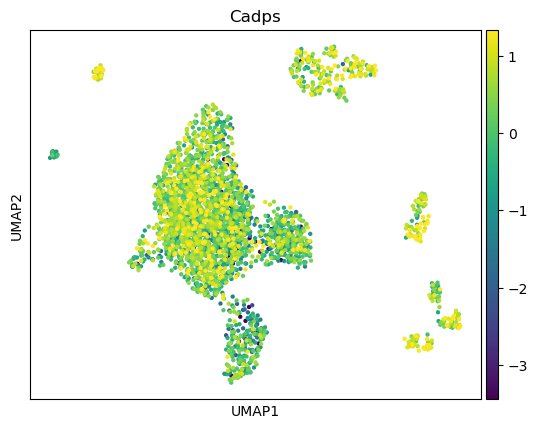

In [26]:
sc.pl.umap(introexon_no6, color='Cadps',vmax='p95')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


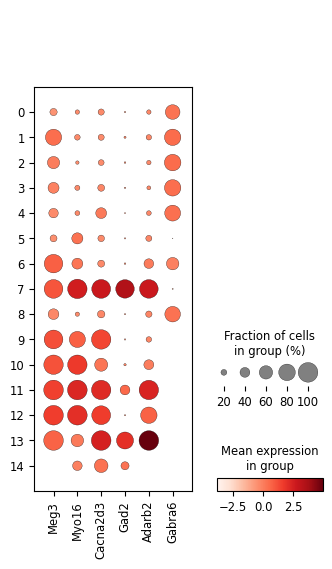

In [21]:
sc.pl.dotplot(introexon_no6,['Meg3','Myo16','Cacna2d3','Gad2','Adarb2','Gabra6'],groupby='leiden')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


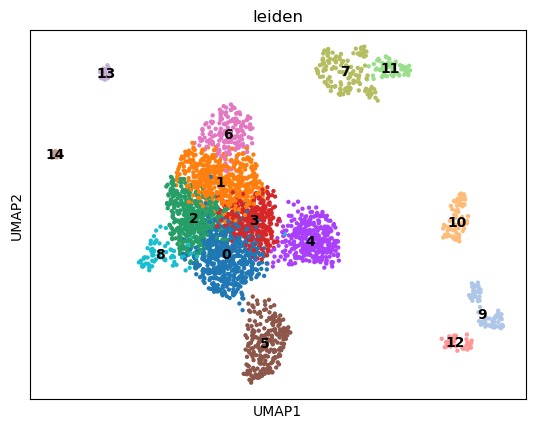

In [7]:
sc.pl.umap(introexon_no6,color=['leiden'],legend_loc="on data")

In [ ]:
introexon_

In [60]:
introexon_no6.obs['leiden'].value_counts()

leiden
0     575
1     519
2     449
3     326
4     323
5     219
6     166
7     132
8      76
9      70
10     67
11     63
12     38
13     29
14     13
Name: count, dtype: int64

In [62]:
dfs['0']

,names,scores,pvals,pvals_adj
0,Cntnap2,18.687649,6.240323e-78,9.794810e-74
1,Pde1c,17.745932,1.853040e-70,1.163413e-66
2,Nlgn1,15.223215,2.480349e-52,1.297719e-48
3,Celf4,14.944723,1.685901e-50,7.560542e-47
4,Cacna2d1,14.012417,1.308748e-44,4.564913e-41
...,...,...,...,...
31387,Spock3,-13.995319,1.664797e-44,5.226130e-41
31388,Sntg1,-14.480230,1.615559e-47,6.339453e-44
31389,Meg3,-17.782217,9.706625e-71,7.617759e-67
31390,Rbfox1,-18.604439,2.957750e-77,3.094989e-73


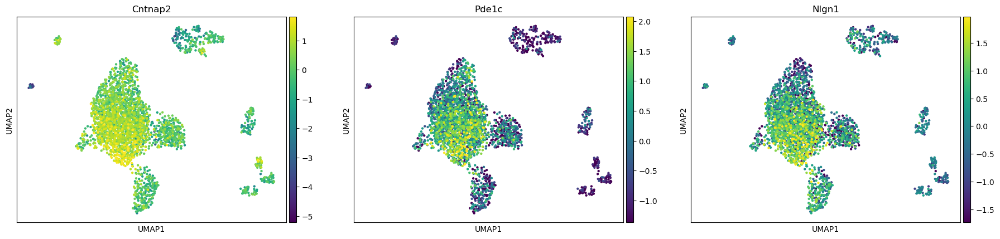

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


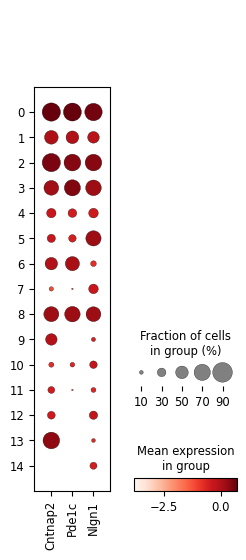

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


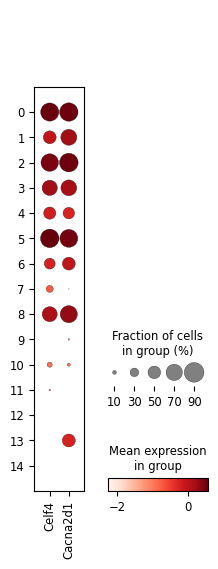

In [72]:
sc.pl.umap(introexon_no6,color=['Cntnap2','Pde1c','Nlgn1'],vmax='p99')
sc.pl.dotplot(introexon_no6,['Cntnap2','Pde1c','Nlgn1'],groupby='leiden')
sc.pl.dotplot(introexon_no6,['Celf4','Cacna2d1'],groupby='leiden')

In [121]:
sc.pp.log1p(introexon_no6)
# 使用rank_genes_groups函数寻找每个群体的特征基因
sc.tl.rank_genes_groups(introexon_no6, 'leiden', method='t-test')


/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.co

In [123]:
pd.DataFrame(introexon_no6.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,Cntnap2,Snhg11,Dlg2,Ptgds,Grik2,Frmd4b,Snhg11,Frmd4a,Gm10718,Ebf1,Cntn5,Gria3,Gria3,Grid2,Atp13a4
1,Pde1c,C130073E24Rik,Kcnip4,Dlg2,Slc4a4,Gria2,Fstl5,Myo16,Gm10800,Maf,Agbl4,Zmat4,Maf,Adarb2,Gabrb1
2,Cacna1e,Reln,Cadps2,Kcnip4,Kcnip4,Grm8,Lrrtm4,Cacna2d3,Gm10717,Cntn5,Egfem1,Meg3,Etl4,Frmd4a,Pla2g7
3,Cacna2d1,Lrrtm4,Lrrtm4,Ddx5,Fgf14,Rgs6,Ano3,Rasgrf1,Gm10719,Gria3,Mdga2,Frmd4a,Zmat4,Dgkh,Atp1a2
4,Dlg2,Gabra6,Cacna1e,Mbp,Rbfox1,Nwd2,Cdk14,Mdga2,Gm11168,Lingo2,Lingo2,Rasgrf1,Opcml,Anks1b,Slc1a2


/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


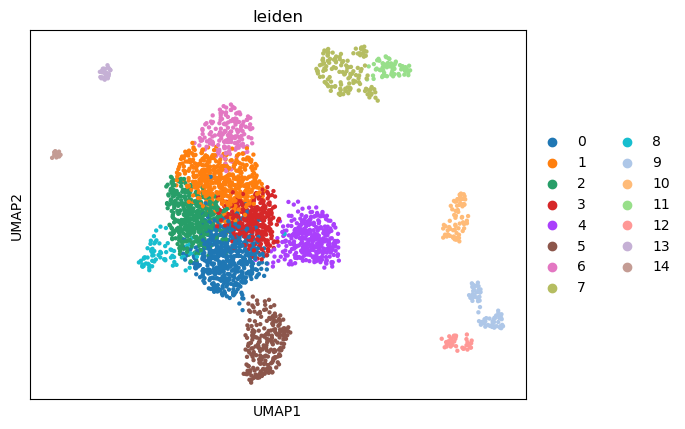

In [88]:
sc.pl.umap(introexon_no6,color='leiden')

In [102]:
marker_gene=pd.read_csv('/home/juany/code/Neuron_Development/marker_gene.csv',index_col=0)

In [103]:
marker_gene

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,Cntnap2,Snhg11,Dlg2,Ptgds,Grik2,Frmd4b,Snhg11,Frmd4a,Gm10718,Ebf1,Cntn5,Gria3,Gria3,Grid2,Atp13a4
1,Pde1c,C130073E24Rik,Kcnip4,Dlg2,Slc4a4,Gria2,Fstl5,Myo16,Gm10800,Maf,Agbl4,Zmat4,Maf,Adarb2,Gabrb1
2,Cacna1e,Reln,Cadps2,Kcnip4,Kcnip4,Grm8,Lrrtm4,Cacna2d3,Gm10717,Cntn5,Egfem1,Meg3,Etl4,Frmd4a,Pla2g7
3,Cacna2d1,Lrrtm4,Lrrtm4,Ddx5,Fgf14,Rgs6,Ano3,Rasgrf1,Gm10719,Gria3,Mdga2,Frmd4a,Zmat4,Dgkh,Atp1a2
4,Dlg2,Gabra6,Cacna1e,Mbp,Rbfox1,Nwd2,Cdk14,Mdga2,Gm11168,Lingo2,Lingo2,Rasgrf1,Opcml,Anks1b,Slc1a2
5,Cadps2,Syt1,Reln,Gabra6,Rims1,Trpc3,Meg3,Gria3,Gm10722,Snhg11,Bnc2,A230006K03Rik,Cntn5,Ryr1,Ptprz1
6,Arpp21,Cadps2,Arpp21,Pde1c,Svep1,Adcy2,Luzp2,Adarb2,Reln,Meis2,Rbms3,Grm7,Cntnap5c,Stac,Slc39a12
7,Car10,Col27a1,Stxbp5l,Atp1a2,Pcdh9,Abr,Tmem132b,Ptprt,Syt1,Frmd4a,Unc5d,Adarb2,Adam23,Vav3,Aldoc
8,Celf4,Dlg2,Rbfox3,Gm28437,Grm4,Elmod1,Tenm2,Lrrc7,Gm10721,Miat,Frmd4a,Meis2,Rbfox1,Trim9,Sparcl1
9,Nlgn1,Cacna1e,Syt1,Plp1,Anks1b,Sulf1,Cep112,Csmd1,Cadps2,Zmat4,Adam23,Csmd3,Miat,Bod1l,Atp1b2


In [142]:
marker_gene['14']

0                 Atp13a4
1                  Gabrb1
2                  Pla2g7
3                  Atp1a2
4                  Slc1a2
5                  Ptprz1
6                Slc39a12
7                   Aldoc
8                 Sparcl1
9                  Atp1b2
10                 Sema6d
11                 Slc4a4
12                  Trps1
13                  Luzp2
14                  Npas3
15                 Gm3764
16    rRNA_rnacentral_223
17                  Mdga2
18                   Gli2
19                 Gm6145
Name: 14, dtype: object

common between 7 and 11 are Frmd4a
Myo16
Cacna2d3
Rasgrf1
Gria3
Adarb2
Lrrc7
Xkr4

but unique marker gene is 在群体7中，Dner、Nav1、Bcan和Spock3是独有的标记基因，而在群体11中，Zmat4、Meg3和Grm7是独有的标记基因。这些基因可能是区分这两个群体的关键。

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


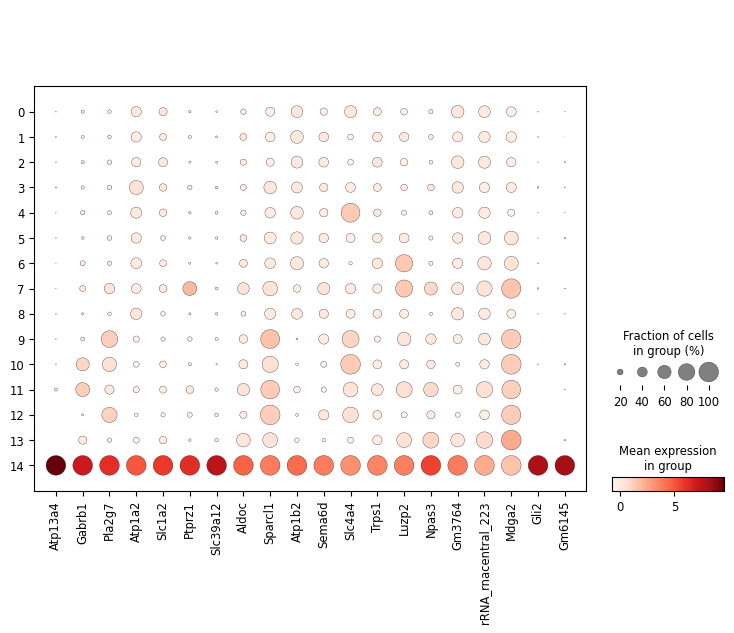

In [153]:
#unique gene for group 14
genes_group14 = marker_gene['14'].tolist()
sc.pl.dotplot(introexon_no6,genes_group14,groupby='leiden')



/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


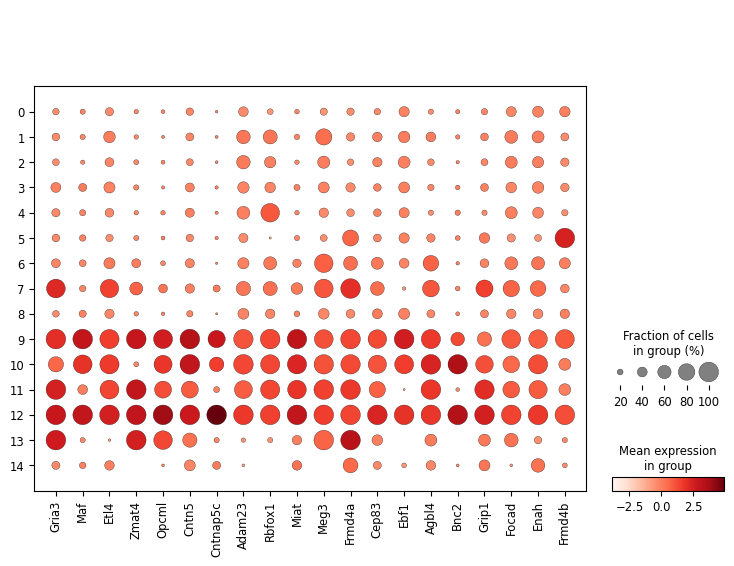

In [152]:
#unique gene for group 12
genes_group12 = marker_gene['12'].tolist()
sc.pl.dotplot(introexon_no6,genes_group12,groupby='leiden')



/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


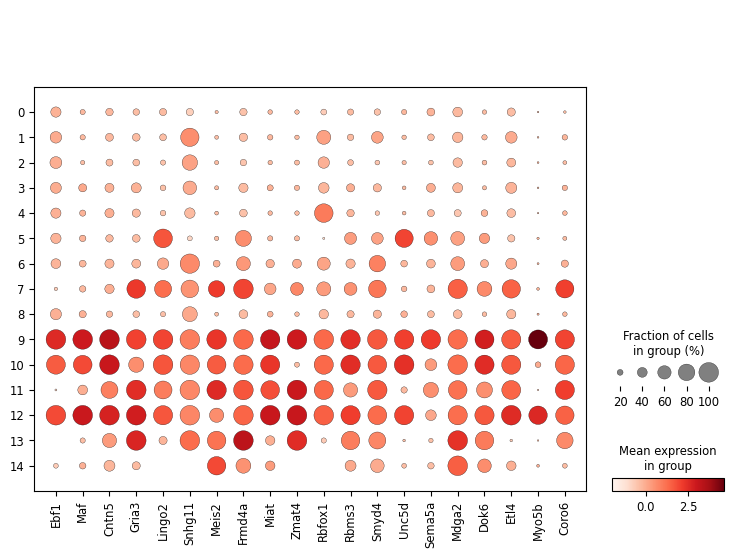

In [151]:
#unique gene for group 9
genes_group9 = marker_gene['9'].tolist()
sc.pl.dotplot(introexon_no6,genes_group9,groupby='leiden')



/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


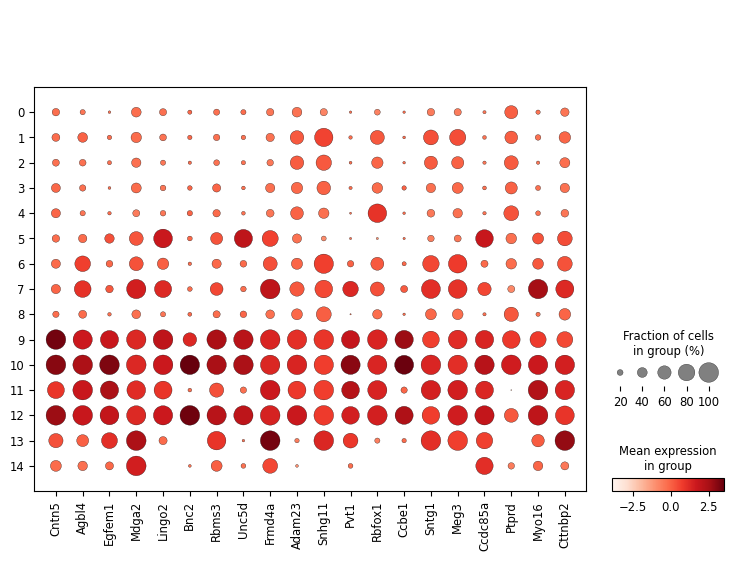

In [150]:
#unique gene for group 10
genes_group10 = marker_gene['10'].tolist()
sc.pl.dotplot(introexon_no6,genes_group10,groupby='leiden')


/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


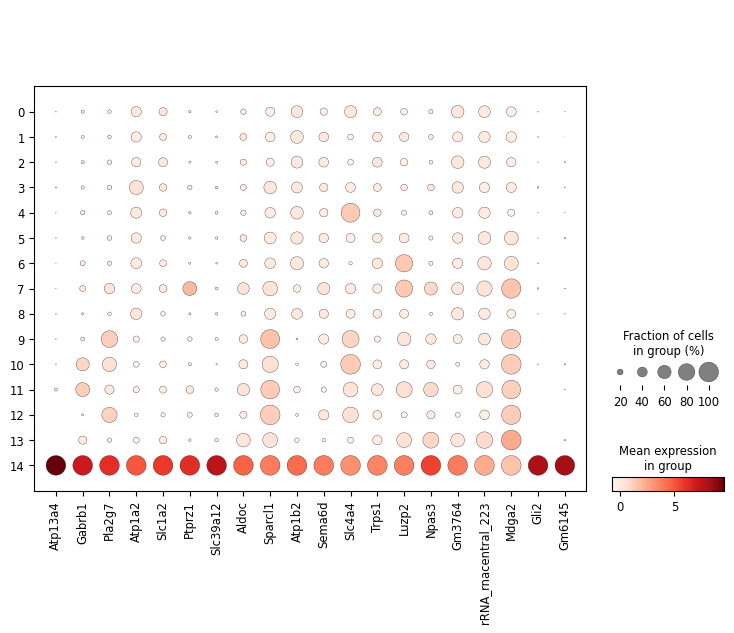

In [149]:
#unique gene for group 14
genes_group14 = marker_gene['14'].tolist()

sc.pl.dotplot(introexon_no6,genes_group14,groupby='leiden')

#we take Atp13a4, Gli2,Gm6145,Slc39a12,Ptprz1

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


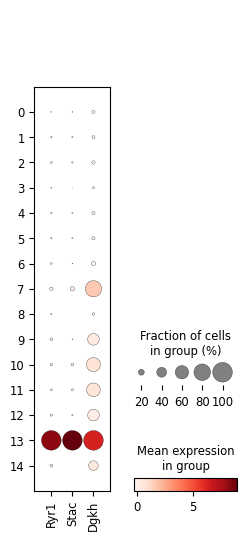

In [141]:
# unique gene for group 13
sc.pl.dotplot(introexon_no6,['Ryr1','Stac','Dgkh'],groupby='leiden')

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


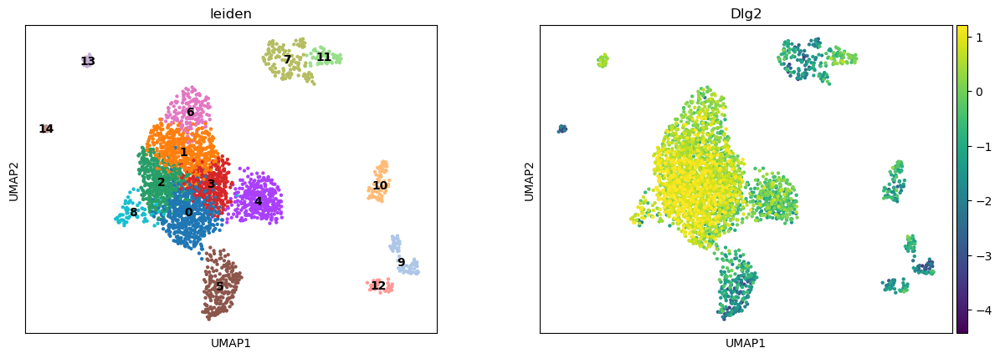

In [109]:
sc.pl.umap(introexon_no6,color=['leiden','Dlg2'],legend_loc='on data',vmax='p95')

In [1]:
import scanpy as sc
introexon_no6=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/introexon_no6.h5ad")

In [22]:
#save it as h5ad file
introexon_no6.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/introexon_no6.h5ad")

In [4]:
introexon_no6.obs['leiden_orig'] = introexon_no6.obs['leiden']

In [5]:
introexon_no6

AnnData object with n_obs × n_vars = 3065 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'leiden_orig'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


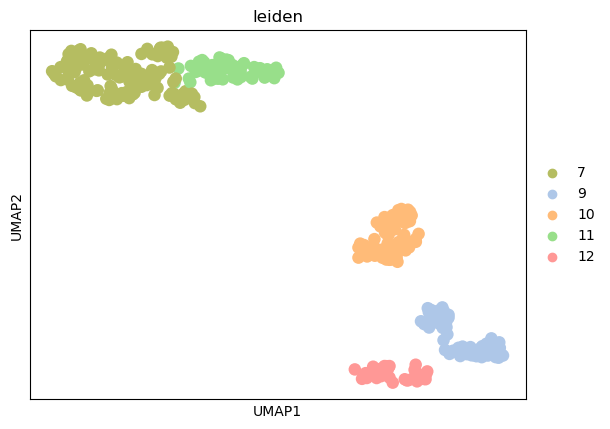

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


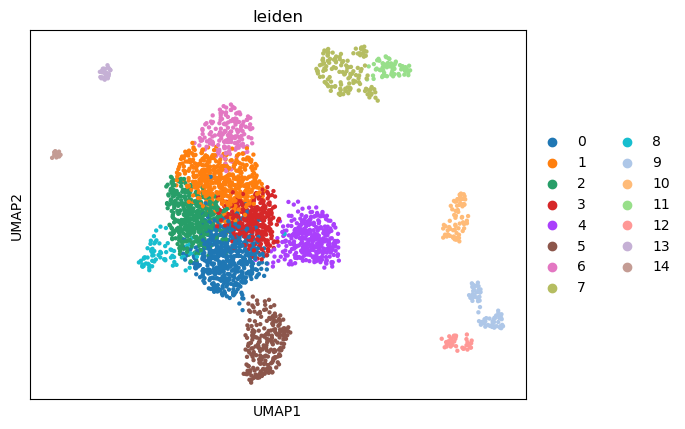

In [13]:
selected_clusters = ['7', '11', '10', '12', '9']
subset=introexon_no6[introexon_no6.obs['leiden'].isin(selected_clusters)]
sc.pl.umap(subset,color='leiden')
sc.pl.umap(introexon_no6,color='leiden')

In [15]:
subset

AnnData object with n_obs × n_vars = 370 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'leiden_orig'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


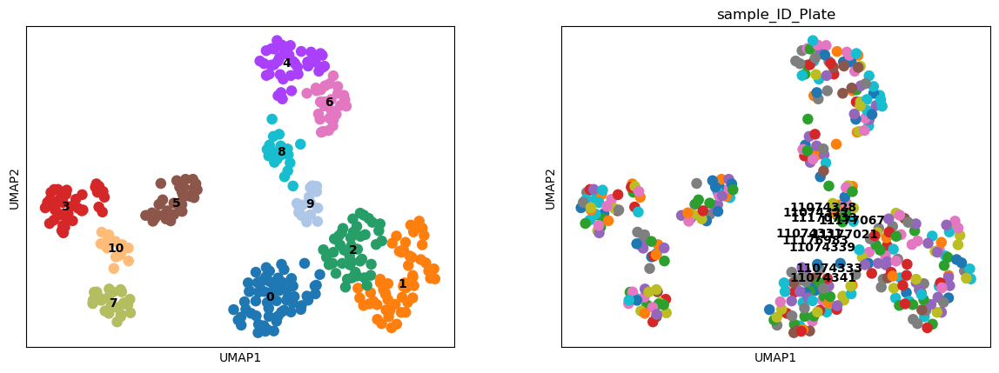

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


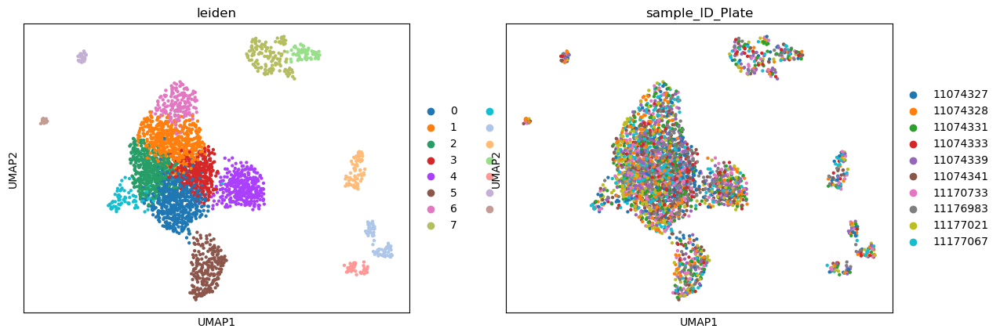

In [16]:
sc.pp.neighbors(subset, n_neighbors=10, n_pcs=30)
sc.tl.umap(subset,min_dist=0.9)
sc.tl.leiden(subset, resolution=0.8)
sc.pl.umap(subset,color=['leiden','sample_ID_Plate'],legend_loc='on data',title='',)
sc.pl.umap(introexon_no6,color=['leiden','sample_ID_Plate'])

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.co

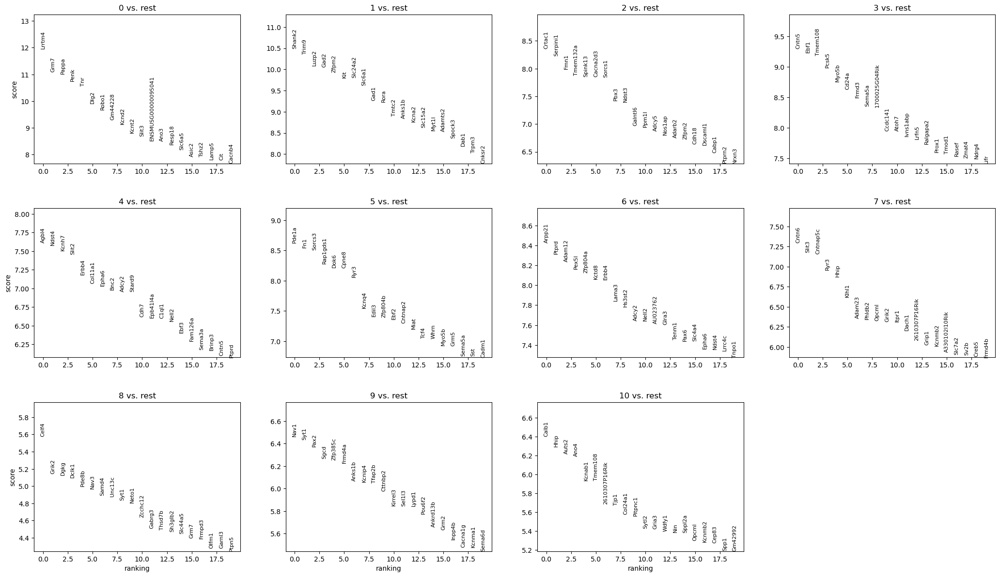

In [10]:
import pandas as pd
sc.pp.log1p(subset)
sc.tl.rank_genes_groups(subset, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(subset, n_genes=20, sharey=False)
df=sc.get.rank_genes_groups_df(subset, pval_cutoff=0.05, log2fc_min=0, key='rank_genes_groups',group='0')

### remove 1,2,3,0

In [29]:
introexon_no6

AnnData object with n_obs × n_vars = 3065 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'leiden_orig'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [32]:
introexon_no6.obs['leiden'].value_counts()

leiden
0     575
1     519
2     449
3     326
4     323
5     219
6     166
7     132
8      76
9      70
10     67
11     63
12     38
13     29
14     13
Name: count, dtype: int64

In [33]:
mask = ~introexon_no6.obs['leiden'].isin(['0', '1', '2', '3'])
mask

AACCACATCGAAGACCGTAA    False
AACCACATCGAAGCTGACCG     True
AACCACATCGACCATATGAG     True
AACCACATCGAGGAGATACA     True
AACCACATCGATAGTCGAAG     True
                        ...  
TTGATCTTGGTGCCTGAGAT     True
TTGATCTTGGTGGTTCGCAA    False
TTGATCTTGGTTGCCTCGAT    False
TTGATCTTGGTTGCGCTAAT    False
TTGATCTTGGTTGGCTGTTG    False
Name: leiden, Length: 3065, dtype: bool

In [34]:
middleremove=introexon_no6[mask]
middleremove

View of AnnData object with n_obs × n_vars = 1196 × 31392
    obs: 'sample_ID_Plate', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'sex', 'leiden_orig'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'umi'
    obsp: 'connectivities', 'distances'

In [35]:
#save it as h5ad file
middleremove.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/CNs/analysis/middleremove.h5ad")

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


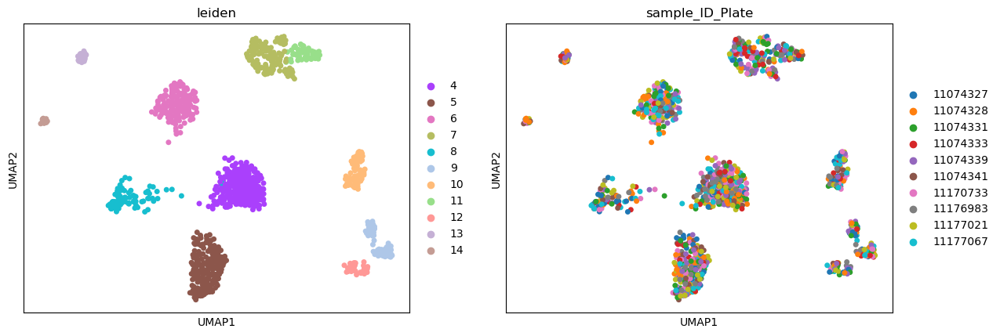

In [38]:
sc.pl.umap(middleremove,color=['leiden','sample_ID_Plate'])

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


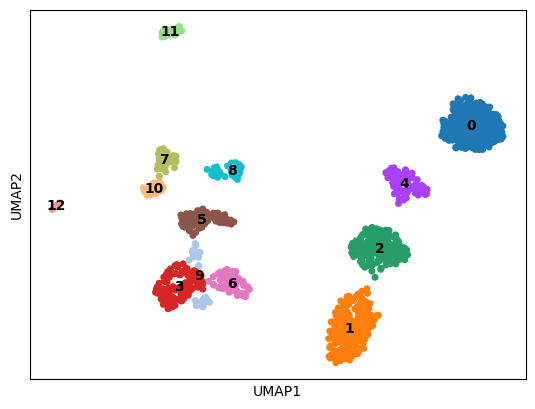

In [40]:
sc.pp.neighbors(middleremove, n_neighbors=15, n_pcs=20)
sc.tl.umap(middleremove,min_dist=0.9)
sc.tl.leiden(middleremove, resolution=0.8)
sc.pl.umap(middleremove,color=['leiden'],legend_loc='on data',title='',)

/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.conda/envs/scanpy/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/juany/.co

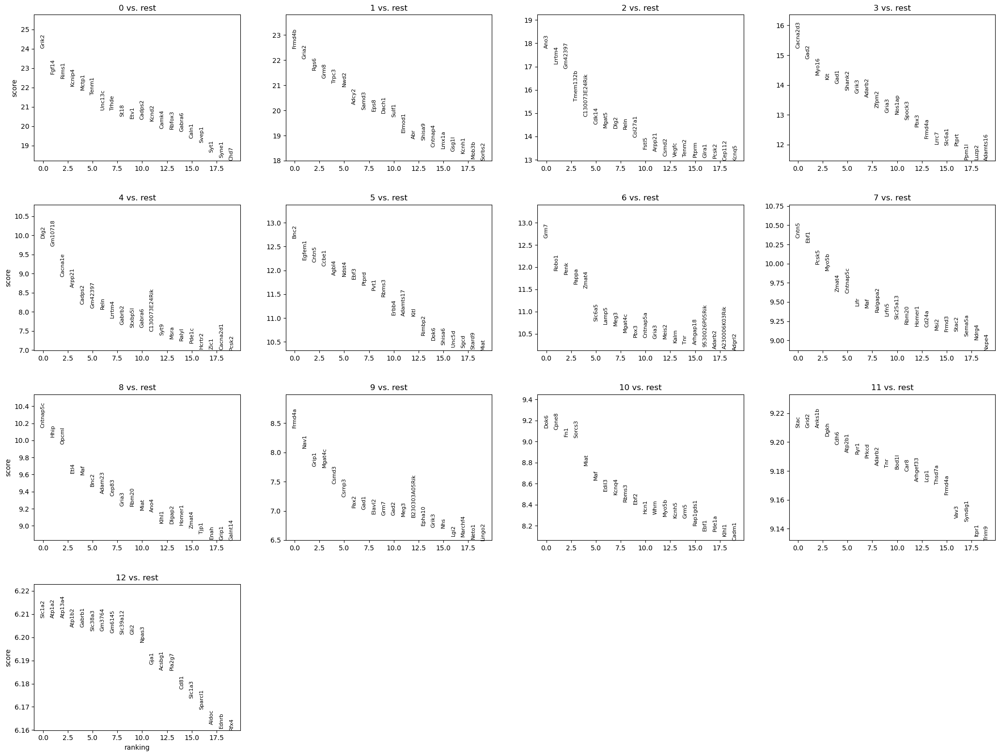

In [41]:
sc.pp.log1p(middleremove)
sc.tl.rank_genes_groups(middleremove, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(middleremove, n_genes=20, sharey=False)

In [45]:
df=sc.get.rank_genes_groups_df(middleremove, pval_cutoff=0.05, log2fc_min=0, key='rank_genes_groups',group='0')
df

,names,scores,logfoldchanges,pvals,pvals_adj
0,Slc4a4,17.949091,5.821231,4.878226e-72,5.889895e-69
1,Grm4,15.111829,10.003698,1.353316e-51,5.983564e-49
2,Rims2,14.569453,7.195196,4.393908e-48,1.768379e-45
3,Rapgef4,13.933462,4.670734,3.966536e-44,1.310711e-41
4,Rbfox1,10.945073,3.327775,7.016075e-28,1.095764e-25
...,...,...,...,...,...
244,Lrp1b,-10.432585,2.184842,1.760339e-25,2.371698e-23
245,Lmx1a,-11.339717,1.517318,8.341419e-30,1.446706e-27
246,Dach1,-13.350171,4.687595,1.181775e-40,3.372572e-38
247,Sorbs2,-14.881510,2.768107,4.345785e-50,1.818972e-47


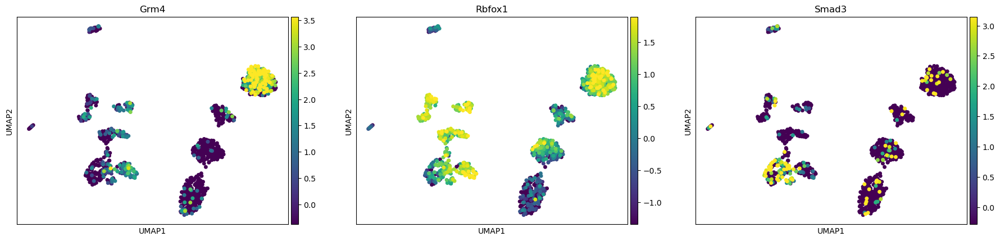

In [53]:
sc.pl.umap(middleremove,color=['Grm4','Rbfox1','Smad3'],vmax='p95')

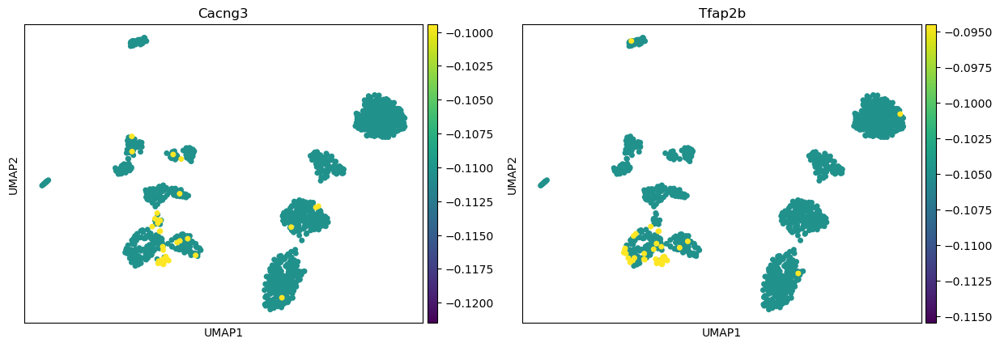

In [55]:
Golgi_cells=['Cacng3','Tfap2b']
sc.pl.umap(middleremove, color=Golgi_cells, vmax='p95')

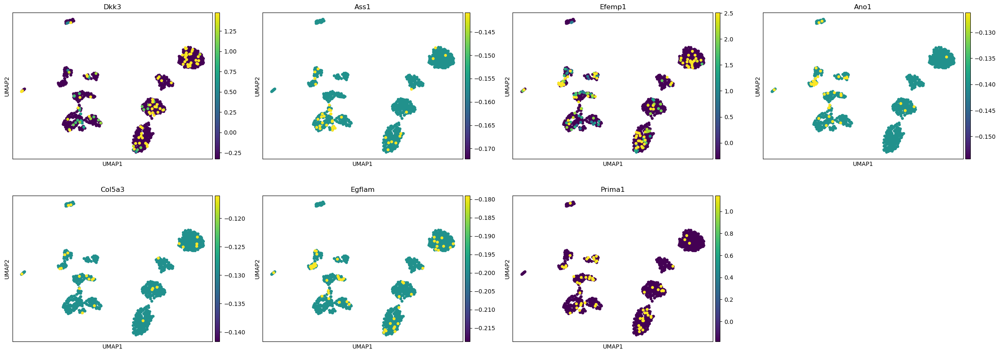

In [56]:
bushy_cells=['Dkk3', 'Ass1', 'Efemp1', 'Ano1', 'Col5a3', 'Egflam', 'Prima1']
sc.pl.umap(middleremove, color=bushy_cells, vmax='p95')

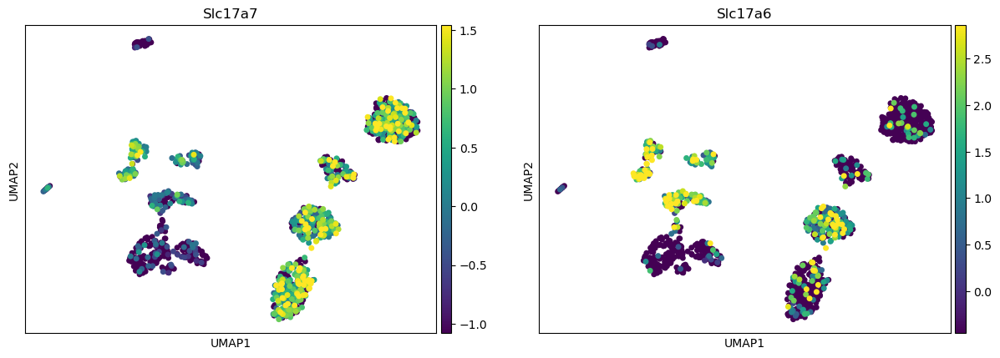

In [57]:
glutamate_t=['Slc17a7','Slc17a6']
sc.pl.umap(middleremove, color=glutamate_t, vmax='p95')

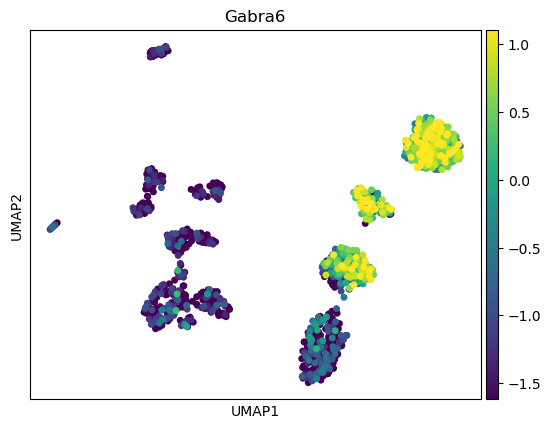

In [59]:
Granule=['Gabra6']
sc.pl.umap(middleremove, color=Granule, vmax='p95')